<a href="https://colab.research.google.com/github/maryam-sabet/YOLOv8_ObjectDetection_SelfDrivingCarData/blob/main/YOLOv8_Object_Detection_on_Self_Driving_Car_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **YOLOv8 Object Detection on Self-Driving-Car Data**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Extract Data**

In [ ]:
# !pip install patool
# import patoolib
# # Specify the path to the RAR archive file
# rar_file = "/content/drive/MyDrive/Object Detection/datayolo.rar"

# # Specify the destination directory where you want to extract the files
# destination_dir = "/content/drive/MyDrive/Object Detection/"

# patoolib.extract_archive(rar_file, outdir=destination_dir)



# **Import Libraries**

In [ ]:
!pip install ultralytics

In [5]:
import ultralytics
from ultralytics import YOLO
import random
import numpy as np
import PIL
from PIL import Image
from IPython.display import display
import matplotlib.pyplot as plt
import glob
import random
import cv2
import pandas as pd
from PIL import Image
import numpy as np
yolo_model = YOLO('yolov8m.pt')

# **Load Data**

In [6]:
images = sorted(glob.glob('/content/drive/MyDrive/Object Detection/images/*'))

In [7]:
len(images)

22241

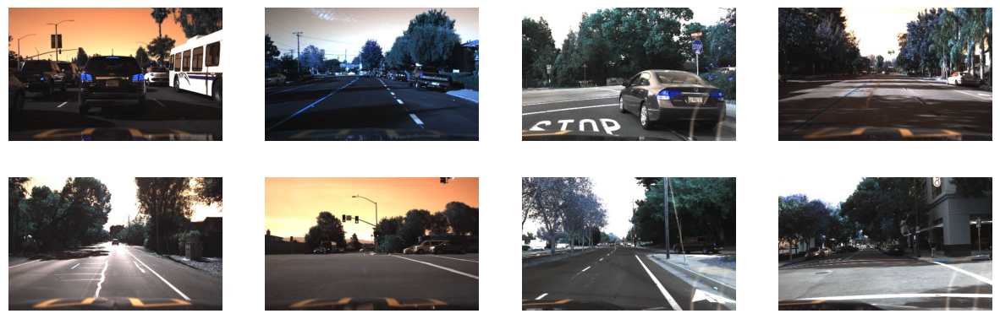

In [8]:
samples = 8
random_image = random.sample(images, samples)
plt.figure(figsize=(15,10))
for i in range(samples):
    plt.subplot(4,4,i+1)
    plt.imshow(cv2.imread(random_image[i] , cv2.COLOR_BGR2RGB))
    plt.axis('off')

In [9]:
# Create a list to store image information
image_info = []
image_predict = []

for i in images[1000:2000]:
    yolo_outputs = yolo_model.predict(i)
    output = yolo_outputs[0]

    for j in range(len(output.boxes)):
        label = output.names[output.boxes.cls[j].item()]
        path = output.path
        coordinates = output.boxes.xyxy[j].tolist()
        confidence = round(output.boxes.conf[j].item(), 2)

        image_info.append({
            'Image Name': path,  # Replace with the actual image name
            'Label': label,
            'Coordinates': coordinates,
            'Confidence': confidence
        })

     # Store the image in the 'images' list
    image_predict.append(output.plot()[:, :, ::-1])

# Create a DataFrame from the image_info list
df = pd.DataFrame(image_info)

# Save the DataFrame as a CSV file
df.to_csv('/content/drive/MyDrive/Object Detection/image_info.csv', index=False)



image 1/1 /content/drive/MyDrive/Object Detection/images/1478020804211507186.jpg: 416x640 1 car, 134.5ms
Speed: 16.3ms preprocess, 134.5ms inference, 37.0ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /content/drive/MyDrive/Object Detection/images/1478020804717884045.jpg: 416x640 1 car, 27.8ms
Speed: 2.9ms preprocess, 27.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /content/drive/MyDrive/Object Detection/images/1478020805211820617.jpg: 416x640 1 car, 27.7ms
Speed: 2.2ms preprocess, 27.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /content/drive/MyDrive/Object Detection/images/1478020805712594806.jpg: 416x640 2 cars, 27.8ms
Speed: 2.0ms preprocess, 27.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /content/drive/MyDrive/Object Detection/images/1478020806211220583.jpg: 416x640 1 car, 1 fire hydrant, 1 bench, 26.5ms
Speed: 2.2ms preprocess, 26.5ms inference, 1.6ms postproc

In [10]:
np.save("/content/drive/MyDrive/Object Detection/image_predict.npy", np.array(image_predict))

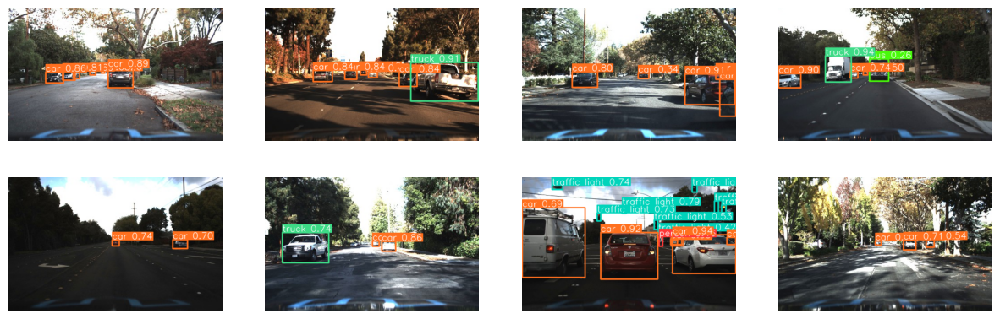

In [11]:
# the results for the samples have been presented visually..
samples = 8
random_image = random.sample(image_predict, samples)
plt.figure(figsize=(15,10))
for i in range(samples):
    plt.subplot(4,4,i+1)
    plt.imshow(random_image[i])
    plt.axis('off')

In [12]:
#Creating a Gif

# Assuming image_predict is a list of numpy arrays representing frames
frames = image_predict[100:200]
# Create a list to store the image objects
images_frame = []

# Convert each numpy array to a PIL image and append it to the list
for frame_data in frames:
    img = Image.fromarray(frame_data)
    images_frame.append(img)

# Specify the path to save the animated GIF
path_gif = '/content/drive/MyDrive/Object Detection/animation.gif'

# Save the list of images as an animated GIF
images_frame[0].save(path_gif, save_all=True, append_images=images_frame[1:], duration=200, loop=0)


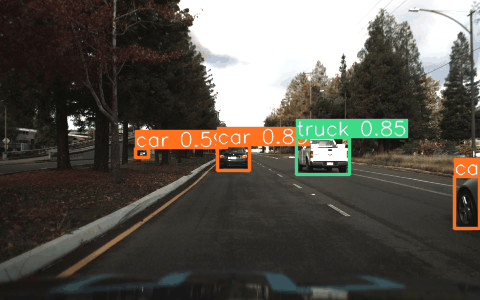

In [13]:
from IPython.display import Image
Image(filename=path_gif)